# Import The Main Libraries

In [98]:
## Most Important
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

## other
import missingno as msno
import warnings
warnings.filterwarnings("ignore")
import os

## Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report

## processing
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline, FeatureUnion


## Models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Load the Dataset

In [2]:
## Read The CSV File Using Pandas
file_path = os.path.join(os.getcwd(), r"ML_data\\Credit_Score.csv")
df_credit = pd.read_csv(file_path)

## Show the Head of Data
df_credit.head()

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Credit_History_Age_Months
0,23,Scientist,19114.12,3,4,3,4,5,4,6.27,...,Good,809.98,31.377862,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good,268
1,23,Scientist,19114.12,3,4,3,4,6,0,11.27,...,Good,809.98,24.797347,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,Good,269
2,23,Scientist,19114.12,3,4,3,4,3,8,11.27,...,Good,809.98,22.537593,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,Good,271
3,23,Scientist,19114.12,3,4,3,4,3,6,11.27,...,Good,809.98,23.933795,No,49.574949,24.785217,High_spent_Medium_value_payments,358.124168,Standard,0
4,28,Teacher,34847.84,2,4,6,1,7,1,7.42,...,Good,605.03,38.550848,No,18.816215,40.391238,High_spent_Large_value_payments,484.591214,Good,320


In [3]:
df_credit.columns

Index(['Age', 'Occupation', 'Annual_Income', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour',
       'Monthly_Balance', 'Credit_Score', 'Credit_History_Age_Months'],
      dtype='object')

# Explain the Features

* `I Understood about these Features:`

>> * `1. Age: The age of the individual(numeric: from 14 to 56)`
>> *  2. Occupation: The occupation or job field of the individual(nominal: ['Accountant', 'Architect', 'Developer', 'Doctor', 'Engineer', 'Entrepreneur', 'Journalist', 'Lawyer', 'Manager', 'Mechanic', 'Media_Manager', 'Musician', 'Scientist', 'Teacher', 'Writer'])
>> * `3. Annual Income: The annual income of the individual(numeric: from 7006.52 to 24198062.0)`
>> *  4. Number of Bank Accounts: The number of bank accounts the individual has(numeric: from 0 to 10)
>> * `5. Number of Credit Cards: The number of credit cards owned by the individual(numeric: from 0 to 10)`
>> *  6. Interest Rate: The interest rate applicable(numeric: from 1 to 34)
>> * `7. Number of Loans: The number of loans the individual has(numeric: from 0 to 9)`
>> *  8. Delay from Due Date: The number of days delayed from the due date(numeric: from 0 to 60)
>> * `9. Number of Delayed Payments: The count of payments that have been delayed(numeric: from 0 to 4397)`
>> *  10. Changed Credit Limit: Any changes in the credit limit(floating: from 0.0 to 26.9)
>> * `11. Credit Mix: The type of credit mix(nominal: 'Bad': This category typically indicates the presence of a set of debts or credit obligations that may be consistently late or have incurred significant delays, reflecting a weak credit history,
'Good': This category generally means there is a good diversity in types of credit and repayment practices, indicating a strong credit history and good debt management capability,
'Standard': This category suggests there is a reasonable level of credit diversity without significant delays or major repayment issues, reflecting a stable and acceptable financial status in terms of credit obligations.)`
>> *  12. Num_Credit_Inquiries: Denotes the number of credit inquiries made on the credit reports of the individuals(numeric: from 0 to 12)
>> * `13. Outstanding Debt: The remaining debt amount(floating: from 0.23 to 1499.92)`
>> *  14. Credit Utilization Ratio: The ratio of credit utilization(floating: from 20.83 to 49.56)
>> * `15. Payment of Minimum Amount: Whether the minimum required amount has been paid(nominal: 
      (1) NM (Not Mentioned): Indicates that there is no specific information mentioned about whether the minimum payment was made or not.)
      (2) No: Means that the individual did not make the minimum required payment on time.
      (3) Yes: Indicates that the individual made the minimum required payment on time.`
>> * `16. Total EMI per month: The total Equated Monthly Installment amount per month(floating: from 0 to 199.9)`
>> *  17. Amount invested monthly: The amount invested monthly(floating: from 0 to 1903.08)
>> * `18. Payment Behavior: The pattern of payment behavior(nominal:
        (1) 'High_spent_Large_value_payments',
        (2) 'High_spent_Medium_value_payments',
        (3) 'High_spent_Small_value_payments',
        (4) 'Low_spent_Large_value_payments',
        (5) 'Low_spent_Medium_value_payments',
        (6) 'Low_spent_Small_value_payments')`
>> * `19. Monthly Balance: The amount available in the customer's account at the end of each month after deducting payments and fees(floating: from 0 to 1602.04)`
>> * `20. Credit Score: It aims to represent the score obtained after evaluating the customer's credit(nominal:
      (1) 'Good': Indicates a good credit score, meaning the customer has a strong credit history and is considered a low risk.
      (2) 'Poor': Indicates a bad credit score, meaning the customer has a poor credit history and is considered a high risk.
      (3) 'Standard': Refers to an average credit score, meaning the customer has an average credit history and is not considered high or low risk.)`
>> * `21. Credit History Age (Months): The age of the credit history in months(numeric: from 0 to 404)`

# Some Information on the Data

In [4]:
## Shape of Data
print(f"Data Shape: Number of Rows = {df_credit.shape[0]}, Number of Columns = {df_credit.shape[1]}")

Data Shape: Number of Rows = 31711, Number of Columns = 21


In [5]:
## Some Information on (records_count, index_range, columns_count, is_null, data_type, memory_usage)
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31711 entries, 0 to 31710
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Age                        31711 non-null  int64  
 1   Occupation                 31711 non-null  object 
 2   Annual_Income              31711 non-null  float64
 3   Num_Bank_Accounts          31711 non-null  int64  
 4   Num_Credit_Card            31711 non-null  int64  
 5   Interest_Rate              31711 non-null  int64  
 6   Num_of_Loan                31711 non-null  int64  
 7   Delay_from_due_date        31711 non-null  int64  
 8   Num_of_Delayed_Payment     31711 non-null  int64  
 9   Changed_Credit_Limit       31711 non-null  float64
 10  Num_Credit_Inquiries       31711 non-null  float64
 11  Credit_Mix                 31711 non-null  object 
 12  Outstanding_Debt           31711 non-null  float64
 13  Credit_Utilization_Ratio   31711 non-null  flo

In [6]:
## Show Statical Description of Numerical Columns
df_credit.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,31711.0,35.135032,1.103719e+01,14.000000,26.000000,35.000000,44.000000,5.600000e+01
Annual_Income,31711.0,174904.514631,1.415577e+06,7006.520000,22118.105000,36993.940000,74520.615000,2.419806e+07
Num_Bank_Accounts,31711.0,4.415818,2.305062e+00,0.000000,3.000000,4.000000,6.000000,1.000000e+01
Num_Credit_Card,31711.0,4.801583,1.673844e+00,0.000000,4.000000,5.000000,6.000000,1.000000e+01
Interest_Rate,31711.0,10.256504,5.916633e+00,1.000000,6.000000,9.000000,14.000000,3.400000e+01
Num_of_Loan,31711.0,2.234114,1.700965e+00,0.000000,1.000000,2.000000,3.000000,9.000000e+00
Delay_from_due_date,31711.0,14.985967,9.353937e+00,0.000000,8.000000,13.000000,22.000000,6.000000e+01
Num_of_Delayed_Payment,31711.0,26.493299,2.153883e+02,0.000000,6.000000,11.000000,15.000000,4.397000e+03
Changed_Credit_Limit,31711.0,8.601820,5.119076e+00,0.000000,4.550000,8.370000,11.620000,2.690000e+01
Num_Credit_Inquiries,31711.0,3.903030,2.813889e+00,0.000000,2.000000,4.000000,6.000000,1.200000e+01


# Data Cleaning

<AxesSubplot:>

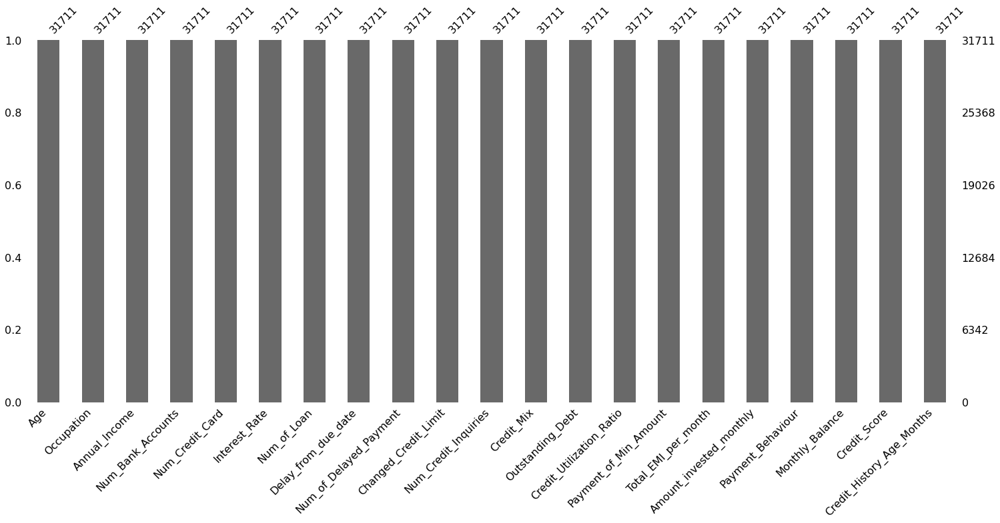

In [7]:
## Show null in each column
msno.bar(df_credit)

In [8]:
## Null_Count in Each Column
df_credit.isnull().sum()

Age                          0
Occupation                   0
Annual_Income                0
Num_Bank_Accounts            0
Num_Credit_Card              0
Interest_Rate                0
Num_of_Loan                  0
Delay_from_due_date          0
Num_of_Delayed_Payment       0
Changed_Credit_Limit         0
Num_Credit_Inquiries         0
Credit_Mix                   0
Outstanding_Debt             0
Credit_Utilization_Ratio     0
Payment_of_Min_Amount        0
Total_EMI_per_month          0
Amount_invested_monthly      0
Payment_Behaviour            0
Monthly_Balance              0
Credit_Score                 0
Credit_History_Age_Months    0
dtype: int64

* > `Comment: No Missing in DataSet`

In [9]:
## Show Duplicate
df_credit[df_credit.duplicated()]

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Credit_History_Age_Months


* > `Comment: No Duplicated in DataSet`

# Show the Correlation

<AxesSubplot:>

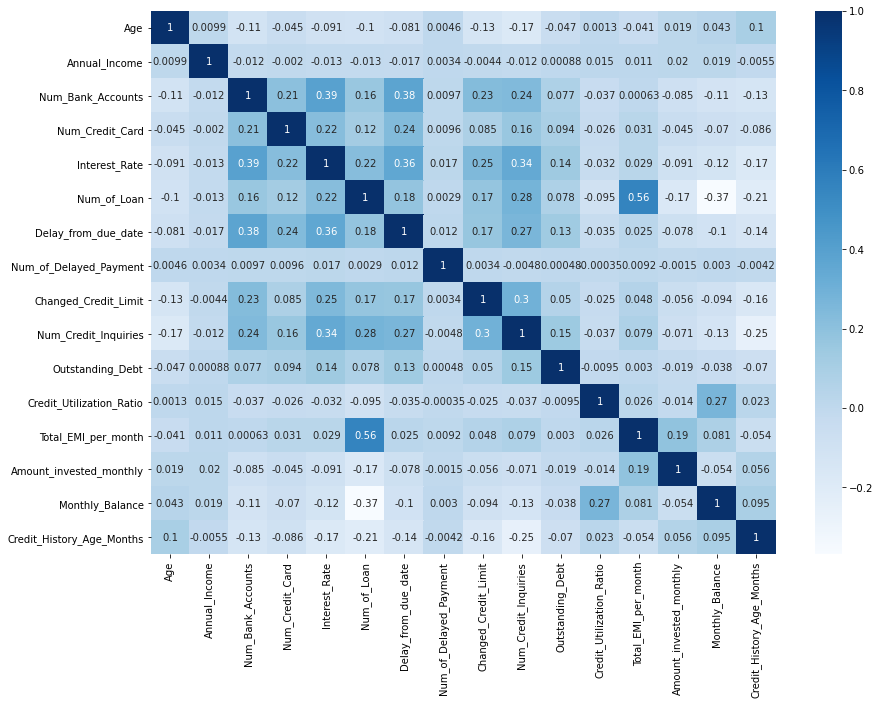

In [10]:
plt.figure(figsize=(14, 10))
sns.heatmap(df_credit.corr(), annot=True, cbar=True, cmap="Blues")

# Data Visualization

In [11]:
## Change the shape of figure
plt.figure(figsize=(10, 6))

## Create a boxplot to visualize the distribution of 'Age' based on 'Credit_Score'
fig = px.box(df_credit, x="Credit_Score", y="Age", title="Age Distribution by Credit Score")

## Show the plot
fig.show()

<Figure size 720x432 with 0 Axes>

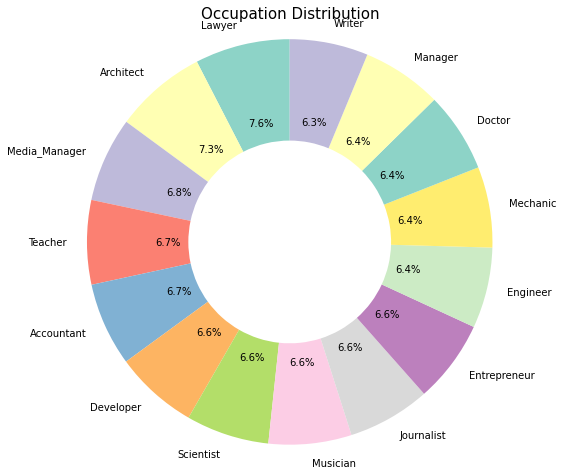

In [12]:
## Change the Shape of Plot
plt.figure(figsize=(8,8))

## Create a PieChart to visualize the distribution of 'occupation'
plt.pie(df_credit["Occupation"].value_counts(),
        labels=df_credit["Occupation"].value_counts().index,
        autopct='%1.1f%%',
        startangle=90,
        colors=plt.cm.Set3.colors,
        wedgeprops=dict(width=0.5))

## title of the plot
plt.title("Occupation Distribution", fontsize=15)

## change on the axis
plt.axis('equal')

## show the plot
plt.show()

In [13]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Create a boxplot to visualize the distribution of 'Annual_Income' based on 'Credit_Score'
fig = px.box(df_credit, x="Credit_Score", y="Annual_Income", title="Annual_Income Distribution by Credit Score")
fig.update_traces(marker_color="green", boxmean="sd")

<Figure size 720x432 with 0 Axes>

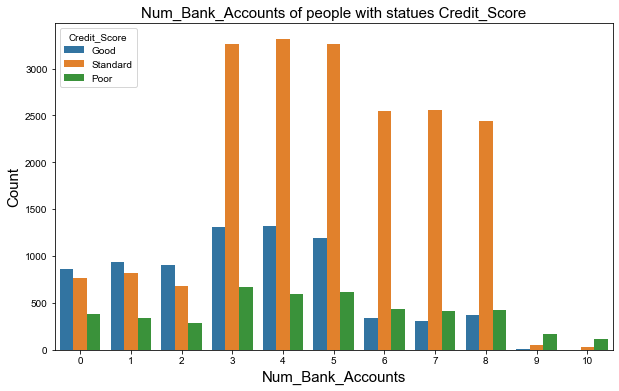

In [14]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Create Count plot of "Num_Bank_Accounts" using seaborn
sns.countplot(x="Num_Bank_Accounts", hue="Credit_Score", data=df_credit)

## Set the Stile of the plot
sns.set_style("whitegrid")

## Tiltle of the plot
plt.title("Num_Bank_Accounts of people with statues Credit_Score", fontsize=15)

## Name the axis
plt.xlabel("Num_Bank_Accounts", fontsize=15)
plt.ylabel("Count", fontsize=15)

## Show the plot
plt.show()

In [15]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Create a boxplot to visualize the distribution of 'Interest_Rate' based on 'Credit_Score'
fig = px.box(df_credit, x="Credit_Score", y="Interest_Rate", title="Interest_Rate Distribution by Credit Score")
fig.update_traces(marker_color="red", boxmean="sd")

<Figure size 720x432 with 0 Axes>

In [16]:
## Create pie chart of "Relationship of Num_of_Loan with Credit_Score" using plotly
px.pie(df_credit, values="Num_of_Loan", names="Credit_Score", title="Relationship of Num_of_Loan with Credit_Score")

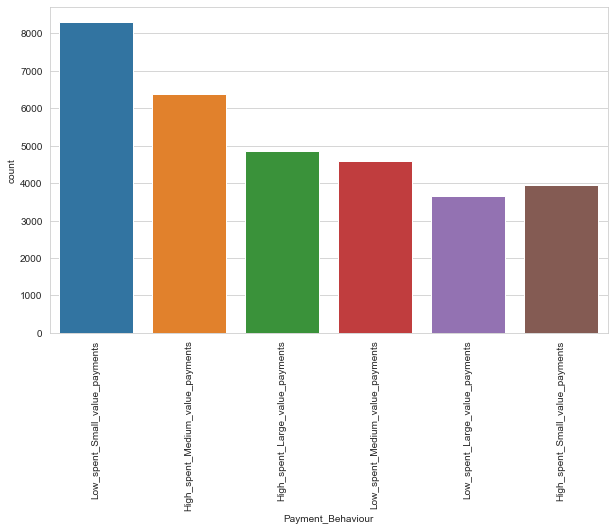

In [17]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Create a CountPlot of "Payment_Behaviour" using seaborn
sns.countplot(x='Payment_Behaviour', data=df_credit)

## Set the Stile of the plot
sns.set_style("whitegrid")

## Change of rotation
plt.xticks(rotation=90)

## Show the plot
plt.show()

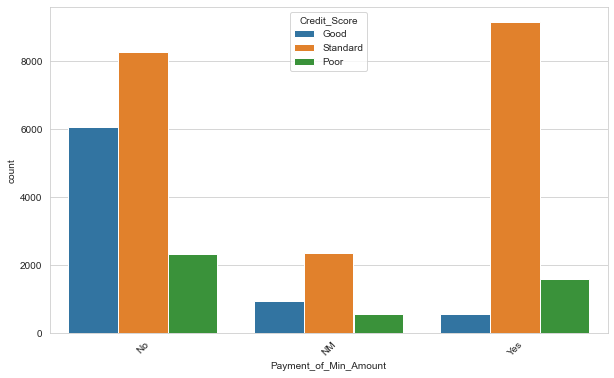

In [18]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Create a CountPlot of "Payment_of_Min_Amount" using seaborn
sns.countplot(x='Payment_of_Min_Amount', hue="Credit_Score", data=df_credit)

## Set the Stile of the plot
sns.set_style("whitegrid")

## Change of rotation
plt.xticks(rotation=45)

## Show the plot
plt.show()

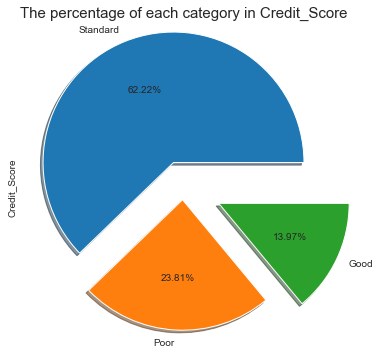

In [19]:
## Change the shape of plot
plt.figure(figsize=(10, 6))

## Create pie plot of "Credit_Score"
df_credit["Credit_Score"].value_counts().plot.pie(explode = [0.2,0.1,0.3], autopct="%1.2f%%",shadow = True,labels = ["Standard","Poor","Good"])

## Title of the plot
plt.title("The percentage of each category in Credit_Score", fontsize=15)

## Show the plot
plt.show()

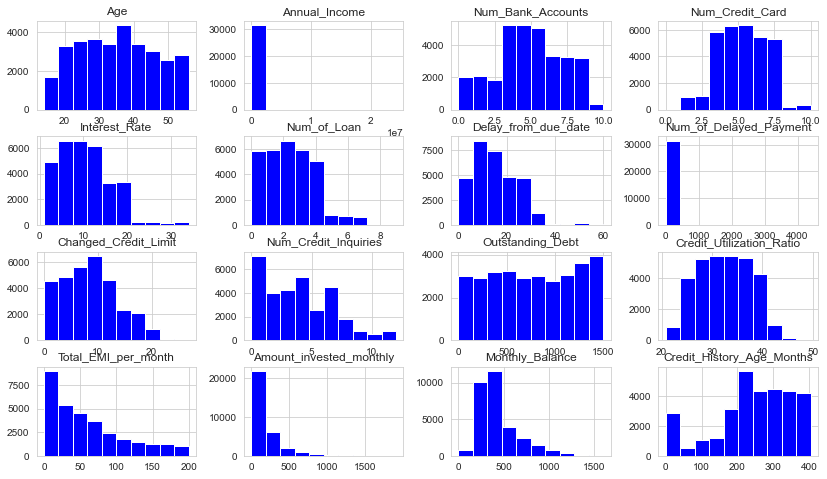

In [20]:
## Histogram for numeric feature
df_credit.hist(figsize=(14, 8), bins=10, color="blue");

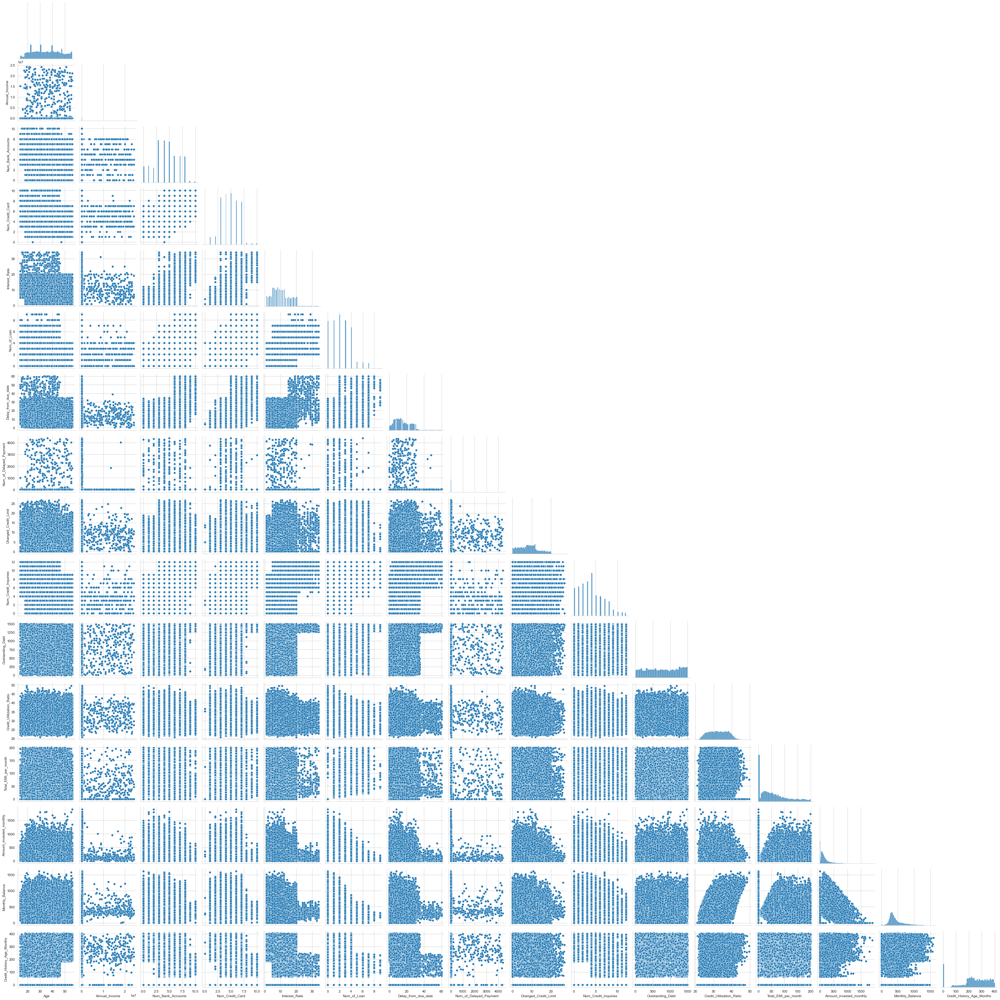

In [21]:
## Plot of feature with others
sns.pairplot(df_credit, corner=True);

# Split the Dataset

In [27]:
## Split the Dataset
X = df_credit.drop(columns="Credit_Score", axis=1)    ## Features
y = df_credit["Credit_Score"]                         ## Target

## Split to train_full and test
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.15, shuffle=True, random_state=123)

## Split to train and valid
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, test_size=0.15, shuffle=True, random_state=123)

## Check of the shape
print(f"X_train shape => {X_train.shape}")
print(f"y_train shape => {y_train.shape}")

print("="*25)

print(f"X_valid shape => {X_valid.shape}")
print(f"y_valid shape => {y_valid.shape}")

print("="*25)

print(f"X_test shape => {X_test.shape}")
print(f"y_test shape => {y_test.shape}")

X_train shape => (22910, 20)
y_train shape => (22910,)
X_valid shape => (4044, 20)
y_valid shape => (4044,)
X_test shape => (4757, 20)
y_test shape => (4757,)


# Feature Processing

In [29]:
## Numerical and Categorical Columns
num_cols = [col for col in X_train.columns if X_train[col].dtype in ['float64', 'float32', 'int64', 'int32']]
categ_cols = [col for col in X_train.columns if X_train[col].dtype not in ['float64', 'float32', 'int64', 'int32']]

* `Scaling of Numerical Features using pipeline`

In [33]:
## Numerical Pipeline
num_pipeline = Pipeline(steps=[
    ("scaler", StandardScaler())
])
num_pipeline.fit(X_train[num_cols])

## transform
X_train_num = num_pipeline.transform(X_train[num_cols])
X_valid_num = num_pipeline.transform(X_valid[num_cols])
X_test_num = num_pipeline.transform(X_test[num_cols])

* `Encoding of Categorical Features using pipeline`

In [40]:
## categorical pipeline
categ_pipeline = Pipeline(steps=[
    ("ohe", OneHotEncoder(sparse_output=False))
])
categ_pipeline.fit(X_train[categ_cols])

## transform
X_train_categ = categ_pipeline.transform(X_train[categ_cols])
X_valid_categ = categ_pipeline.transform(X_valid[categ_cols])
X_test_categ = categ_pipeline.transform(X_test[categ_cols])

* `Encoding of Categorical Label using Label_Encoder`

In [43]:
## Categorical pipeline
y_lbl_encoder = LabelEncoder()
y_lbl_encoder.fit(y_train)

## transform
y_train_lbl = y_lbl_encoder.transform(y_train)
y_valid_lbl = y_lbl_encoder.transform(y_valid)
y_test_lbl = y_lbl_encoder.transform(y_test)

In [44]:
## Concatenation numerical features with categorical features
X_train_final = np.c_[X_train_num, X_train_categ]
X_valid_final = np.c_[X_valid_num, X_valid_categ]
X_test_final = np.c_[X_test_num, X_test_categ]

# Building ML Models

* `Evaluation Metric: Accuracy_Score`

# 1) Logistic Regression

In [109]:
## Initialize logistic regression model
logit_clf = LogisticRegression()
## Training on the Data
logit_clf.fit(X_train_final, y_train_lbl)

LogisticRegression()

In [110]:
## Prediction
y_pred_train_logit = logit_clf.predict(X_train_final)
y_pred_valid_logit = logit_clf.predict(X_valid_final)

## metrics
acc_train_logit = accuracy_score(y_train_lbl, y_pred_train_logit)
acc_valid_logit = accuracy_score(y_valid_lbl, y_pred_valid_logit)

print("Accuracy_score for training using LogisticRegression", acc_train_logit)
print("Accuracy_score for validation using LogisticRegression", acc_valid_logit)

Accuracy_score for training using LogisticRegression 0.7085988651243998
Accuracy_score for validation using LogisticRegression 0.7057368941641938


In [111]:
## prediction_test
y_pred_test_logit = logit_clf.predict(X_test_final)

## metrics
acc_test_logit = accuracy_score(y_test_lbl, y_pred_test_logit)

print("Accuracy_score for testing using LogisticRegression", acc_test_logit)

Accuracy_score for testing using LogisticRegression 0.7067479503889006


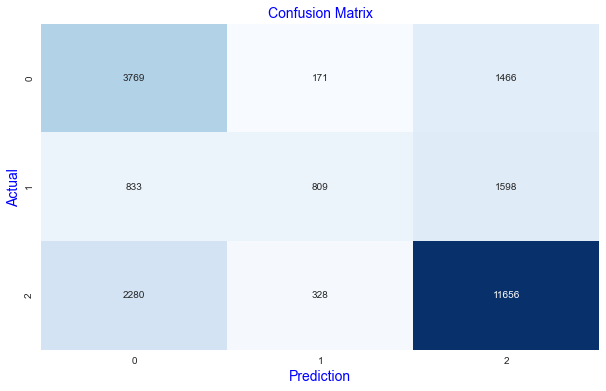

In [112]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Make a Confusion Matrix
confmat_logit = confusion_matrix(y_train_lbl, y_pred_train_logit)
sns.heatmap(confmat_logit,fmt="g", annot=True, cbar=False, cmap="Blues")

## Name the axis
plt.xlabel("Prediction", fontsize=14, c="b")
plt.ylabel("Actual", fontsize=14, c="b")

## Title of the plot
plt.title("Confusion Matrix", fontsize=14, c="b")

## Show the plot
plt.show()

# 2) KNN

In [90]:
## Initialize Knn_clf model
knn_clf = KNeighborsClassifier(n_neighbors=17)
## training on the data
knn_clf.fit(X_train_final, y_train_lbl)

KNeighborsClassifier(n_neighbors=17)

In [91]:
## Prediction
y_pred_train_knn = knn_clf.predict(X_train_final)
y_pred_valid_knn = knn_clf.predict(X_valid_final)

## metrics
acc_train_knn = accuracy_score(y_train_lbl, y_pred_train_knn)
acc_valid_knn = accuracy_score(y_valid_lbl, y_pred_valid_knn)

print("Accuracy_score for training using KNN", acc_train_knn)
print("Accuracy_score for validation using KNN", acc_valid_knn)

Accuracy_score for training using KNN 0.7543430816237451
Accuracy_score for validation using KNN 0.7203264094955489


In [92]:
## prediction_test
y_pred_test_knn = knn_clf.predict(X_test_final)

## metrics
acc_test_knn = accuracy_score(y_test_lbl, y_pred_test_knn)

print("Accuracy_score for testing using LogisticRegression", acc_test_knn)

Accuracy_score for testing using LogisticRegression 0.7176792095858735


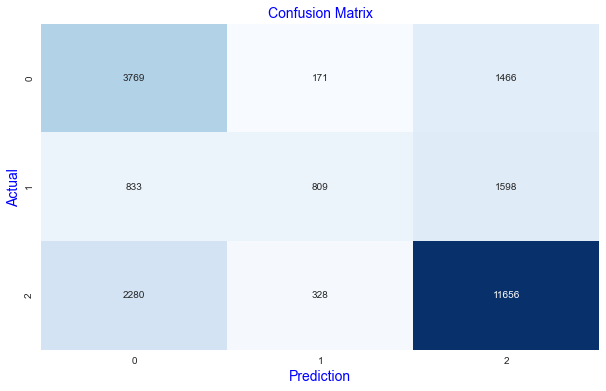

In [93]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Make a Confusion Matrix
confmat_knn = confusion_matrix(y_train_lbl, y_pred_train_knn)
sns.heatmap(confmat_logit,fmt="g", annot=True, cbar=False, cmap="Blues")

## Name the axis
plt.xlabel("Prediction", fontsize=14, c="b")
plt.ylabel("Actual", fontsize=14, c="b")

## Title of the plot
plt.title("Confusion Matrix", fontsize=14, c="b")

## Show the plot
plt.show()

# 3) SVC

In [82]:
svc_clf = SVC(kernel="linear", C=0.1)
svc_clf.fit(X_train_final, y_train_lbl)

SVC(C=0.1, kernel='linear')

In [94]:
## Prediction
y_pred_train_svc = svc_clf.predict(X_train_final)
y_pred_valid_svc = svc_clf.predict(X_valid_final)

## Metrics
acc_train_svc = accuracy_score(y_train_lbl, y_pred_train_svc)
acc_valid_svc = accuracy_score(y_valid_lbl, y_pred_valid_svc)

print("Accuracy_score for training using SVC", acc_train_svc)
print("Accuracy_score for validation using SVC", acc_valid_svc)

Accuracy_score for training using SVC 0.6878655608904408
Accuracy_score for validation using SVC 0.679030662710188


In [96]:
## Prediction_test
y_pred_test_svc = svc_clf.predict(X_test_final)

## Metrics
acc_test_svc = accuracy_score(y_test_lbl, y_pred_test_svc)

print("Accuracy_score for testing using SVC", acc_test_svc)

Accuracy_score for testing using SVC 0.6953962581458902


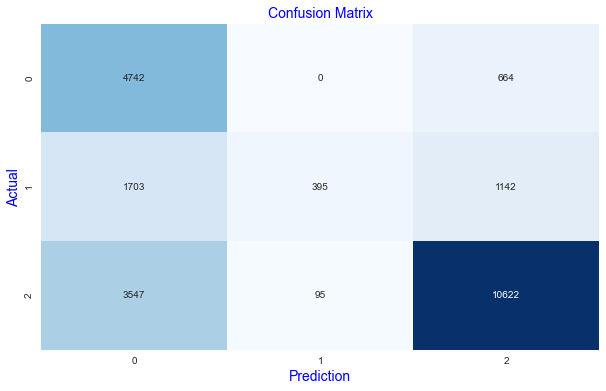

In [97]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Make a Confusion Matrix
confmat_svc = confusion_matrix(y_train_lbl, y_pred_train_svc)
sns.heatmap(confmat_svc, fmt="g", annot=True, cbar=False, cmap="Blues")

## Name the axis
plt.xlabel("Prediction", fontsize=14, c="b")
plt.ylabel("Actual", fontsize=14, c="b")

## Title of the plot
plt.title("Confusion Matrix", fontsize=14, c="b")

## Show the plot
plt.show()

# 4) RandomForest

In [102]:
## Initialize Random Forest Classifier
random_forest = RandomForestClassifier()

## Tuning parameters with using GridSearchCV
params = {"n_estimators":np.arange(200, 701, 50), "max_depth":np.arange(2,11,2)}
gridsearch = GridSearchCV(estimator=random_forest, param_grid=params, cv=5, n_jobs=-1)

## fiting on the data
gridsearch.fit(X_train_final, y_train_lbl)

## Getting the best estimators
best_estimator = gridsearch.best_estimator_

In [103]:
## Training on the data
best_estimator.fit(X_train_final, y_train_lbl)

RandomForestClassifier(max_depth=10, n_estimators=550)

In [105]:
## Prediction
y_pred_train_forest = best_estimator.predict(X_train_final)
y_pred_valid_forest = best_estimator.predict(X_valid_final)

## Metrics
acc_train_forest = accuracy_score(y_train_lbl, y_pred_train_forest)
acc_valid_forest = accuracy_score(y_valid_lbl, y_pred_valid_forest)

print("Accuracy_score for training using RandomForest", acc_train_forest)
print("Accuracy_score for validation using RandomForest", acc_valid_forest)

Accuracy_score for training using RandomForest 0.7860759493670886
Accuracy_score for validation using RandomForest 0.7314540059347181


In [113]:
## Prediction_test
y_pred_test_forest = best_estimator.predict(X_test_final)

## Metrics
acc_test_forest = accuracy_score(y_test_lbl, y_pred_test_forest)

print("Accuracy_score for testing using RandomForest", acc_test_forest)

Accuracy_score for testing using RandomForest 0.748370821946605


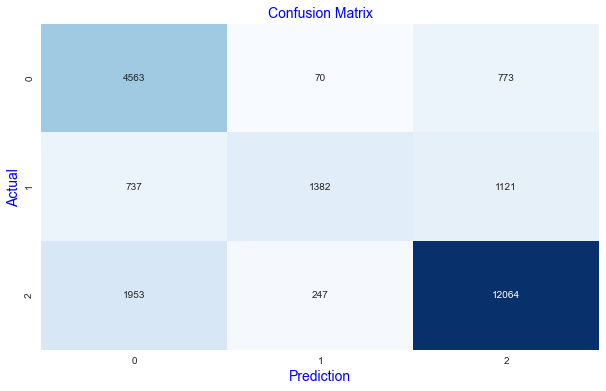

In [114]:
## Change the Shape of plot
plt.figure(figsize=(10, 6))

## Make a Confusion Martrix
confmat_forest = confusion_matrix(y_train_lbl, y_pred_train_forest)
sns.heatmap(confmat_forest, fmt="g", annot=True, cbar=False, cmap="Blues")

## Name the axis
plt.xlabel("Prediction", fontsize=14, c="b")
plt.ylabel("Actual", fontsize=14, c="b")

## Title of the plot
plt.title("Confusion Matrix", fontsize=14, c="b")

## Show the plot
plt.show()